In [10]:
import matplotlib.pyplot as plt
from PIL import Image

from subprocess import Popen, PIPE
import shlex

from matplotlib.pyplot import figure


In [ ]:
!mkdir build || cd build && cmake .. && make



mkdir: build: File exists
-- The C compiler identification is AppleClang 13.0.0.13000027
-- The CXX compiler identification is AppleClang 13.0.0.13000027
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Check for working C compiler: /Library/Developer/CommandLineTools/usr/bin/cc - skipped
-- Detecting C compile features
-- Detecting C compile features - done
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Check for working CXX compiler: /Library/Developer/CommandLineTools/usr/bin/c++ - skipped
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- Found OpenCV: /usr/local/Cellar/opencv/4.6.0_1 (found version "4.6.0") 
-- Configuring done
-- Generating done
-- Build files have been written to: /Users/a.golovatskiy/abby-cv/task2/build
[ 50%] Building CXX object CMakeFiles/main.dir/main.cpp.o


In [12]:
def run_get_time(img_path, ksize, algo):
    with Popen(shlex.split(f"./build/main {img_path} {ksize} {algo}"), stdout=PIPE, bufsize=1, universal_newlines=True) as p:
        while True:
            line = p.stdout.readline()
            if not line:
                break
            time = int(line)
        exit_code = p.poll()
        assert exit_code == 0 
    return time

In [13]:
def img_print(img_path):
    img = Image.open(img_path)
    plt.figure(figsize=(16, 9), dpi=180)
    plt.imshow(img)
    plt.show()


original:


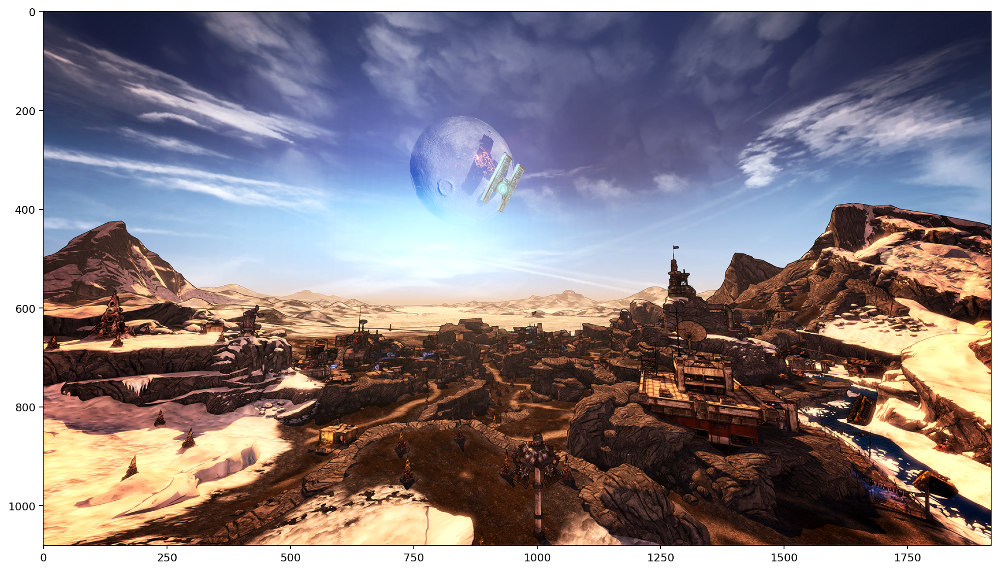

In [14]:
print("original:")
img_print("img/img.bmp")

In [15]:
def run_print(ksize):
    run_get_time("img/img", ksize, "simple")
    run_get_time("img/img", ksize, "huang")
    run_get_time("img/img", ksize, "const-time")
    run_get_time("img/img", ksize, "cv")

    img_print(f"img/img-simple-{ksize}.bmp")
    img_print(f"img/img-huang-{ksize}.bmp")
    img_print(f"img/img-const-time-{ksize}.bmp")
    img_print(f"img/img-cv-{ksize}.bmp")


simple


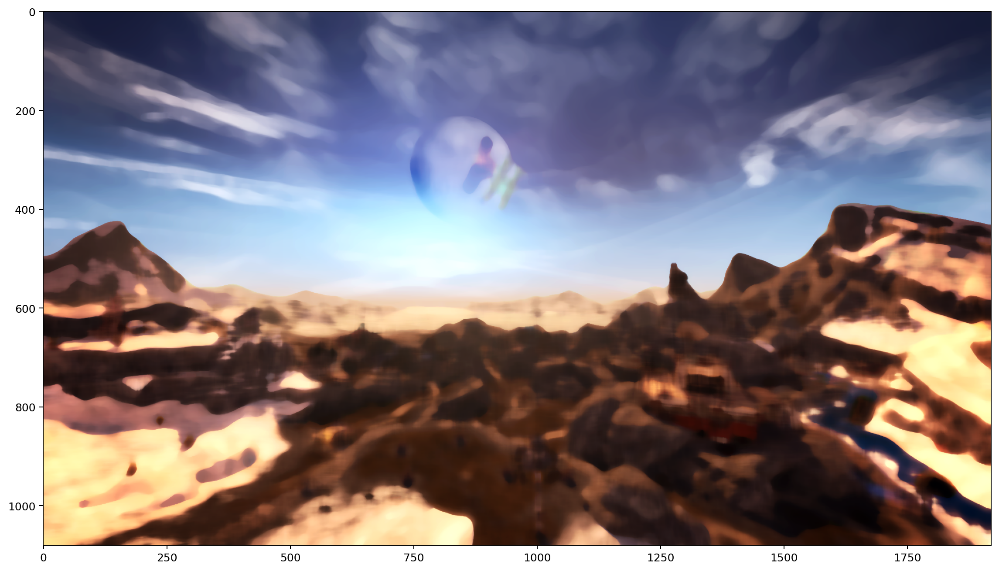

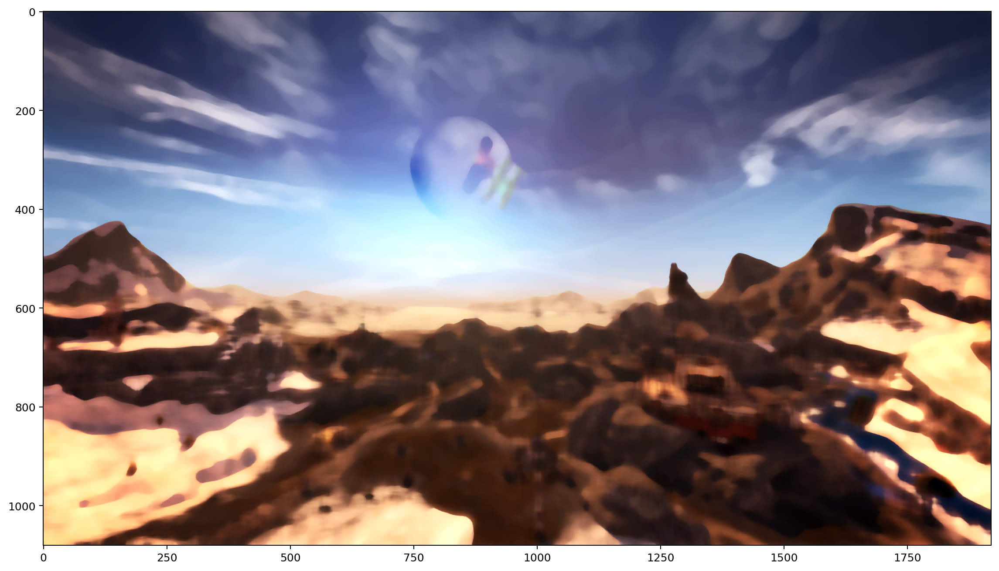

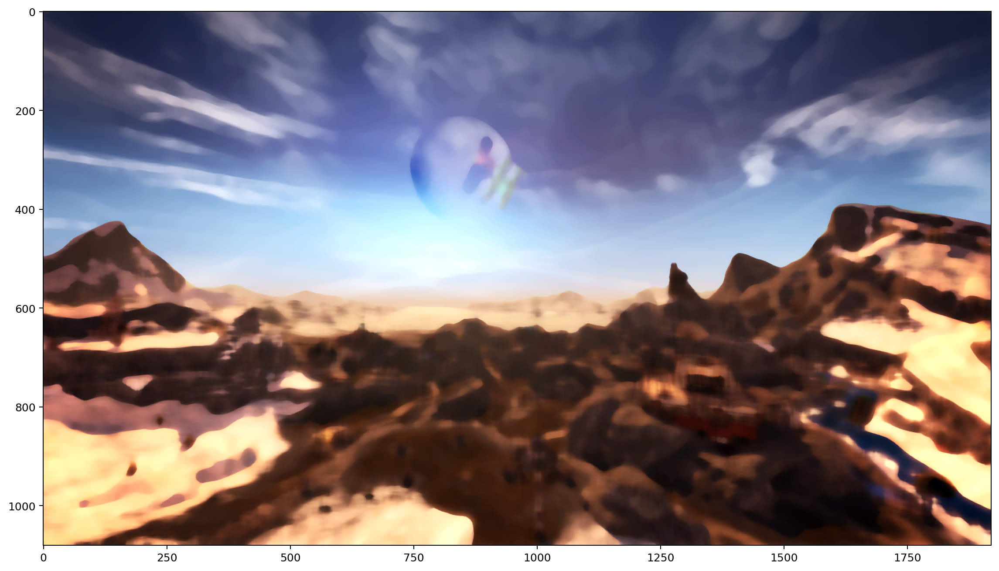

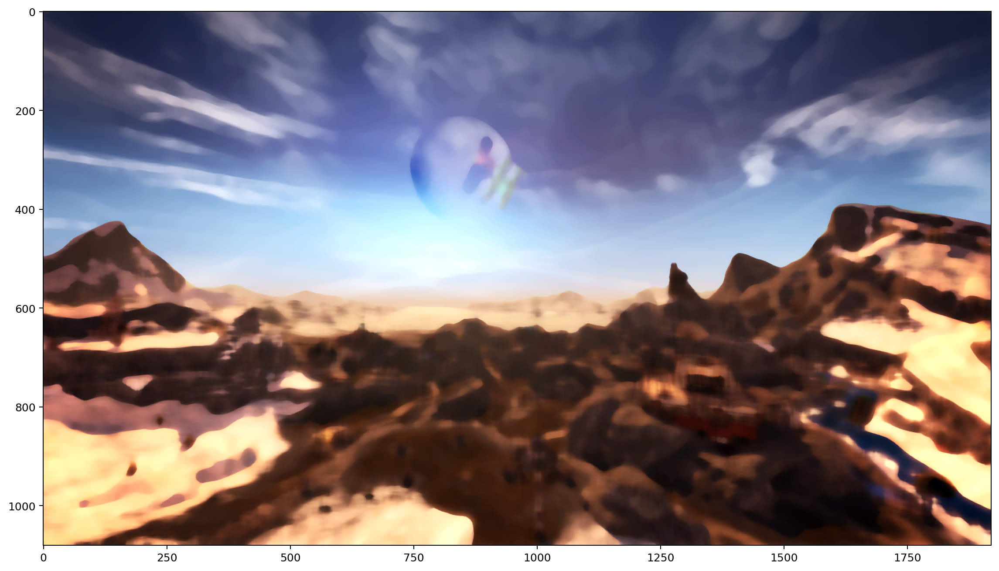

In [16]:
run_print(21)

In [8]:
def run_sizes(ksizes, algo):
    timings = {}
    for ksize in ksizes:
        timings[ksize] = run_get_time("img/img", ksize, algo)
    return timings

In [17]:
default_sizes = [3, 5, 7, 11, 15, 19, 25, 31, 37, 45, 43, 67, 75, 85, 95, 101, 121, 131, 145, 159, 171, 183, 199]

simple_timings = run_sizes([3, 5, 7, 11, 15], "simple")
huang_timings = run_sizes(default_sizes, "huang")
const_time_timings = run_sizes(default_sizes, "const-time")
cv2_timings = run_sizes(default_sizes, "cv")

In [28]:
def print_timings(timings, algo):
    lists = sorted(timings.items())
    x, y = zip(*lists)
    plt.plot(x, y, label=algo)
    
def print_all(algos):
    plt.figure(figsize=(16, 9), dpi=180)


    for key, value in algos.items():
        print_timings(value, key)
    
    plt.xlabel("ksize")
    plt.ylabel("time, nanosecs")
    plt.legend()
    plt.grid()
    plt.show()

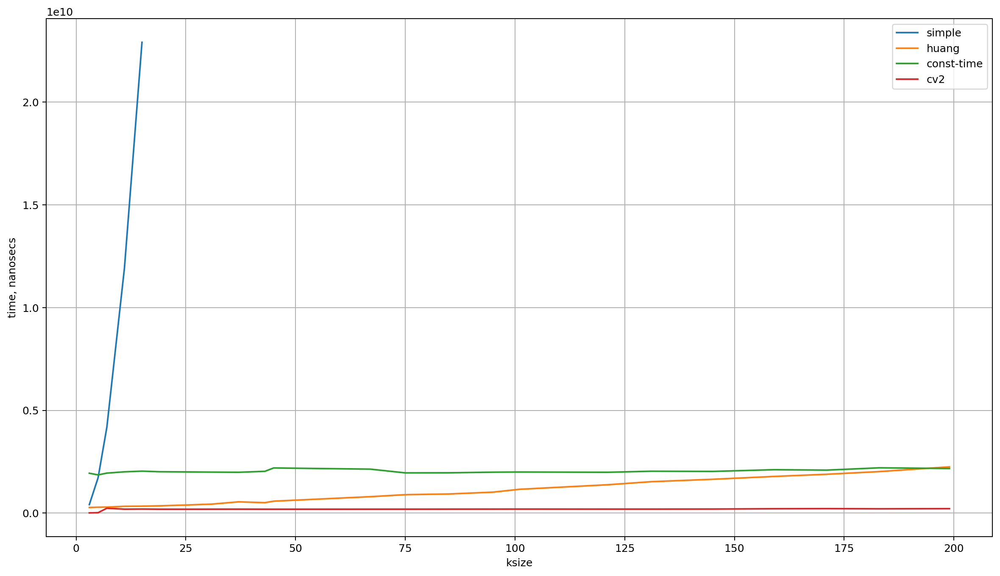

In [29]:
print_all({"simple": simple_timings, "huang": huang_timings, "const-time": const_time_timings, "cv2": cv2_timings})

С simple всё понятно(имеет более чем линейную сложность, ksize * log(ksize) из-за сортировки), исключим его и посмотрим внимательнее.

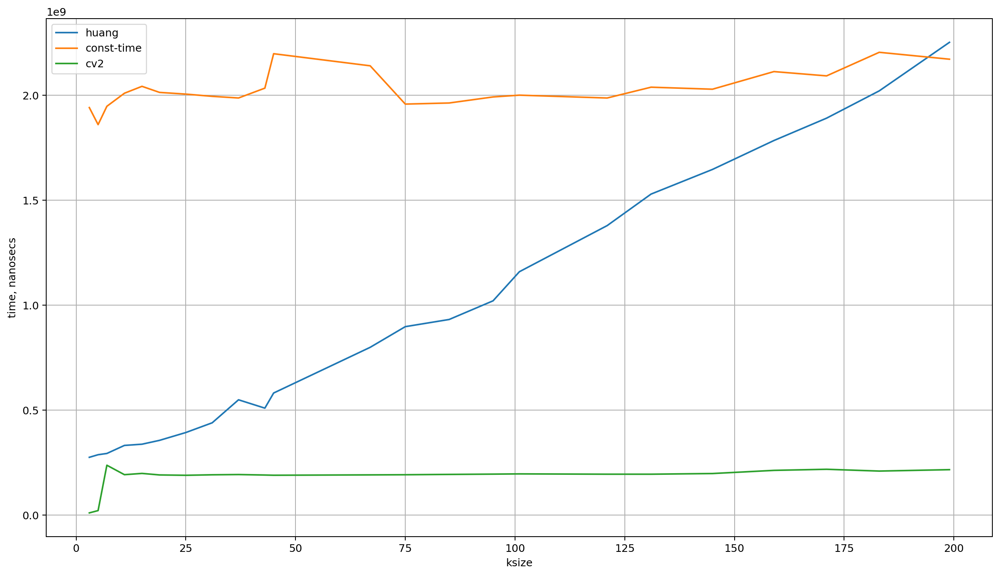

In [31]:
print_all({"huang": huang_timings, "const-time": const_time_timings, "cv2": cv2_timings})

const-time алгоритм действительно имеет констнтное время работы. huang - линейную. 

В нашей реализации, при ksize >= ~190 (R = 100) const-time начинает рабоать лучше huang.

В реализации cv2 используется алгорим с линейной сложностью на больших R. (на малых, до ksize=10 можно увидеть ступньку, возможно до нее используется другой алгоритм)